In [123]:
# ==================== FILE & DATA HANDLING ====================
import os
import glob
import random
import numpy as np
import pandas as pd
from PIL import Image

# ==================== DATA VISUALIZATION ====================
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
from IPython.display import display

# ==================== MODEL EVALUATION ====================
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split

# ==================== DEEP LEARNING ====================
import tensorflow as tf
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.layers import (Dense, GlobalAveragePooling2D, 
                                   Dropout, BatchNormalization)
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras import regularizers
from tensorflow.keras.callbacks import (EarlyStopping, 
                                      ModelCheckpoint)
from tensorflow.keras.applications.efficientnet import preprocess_input
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img

In [5]:
train_df = pd.read_csv("Data/Training_set.csv")  # Training data DataFrame
test_df = pd.read_csv("Data/Testing_set.csv")    # Testing data DataFrame

In [6]:
train_image_files = glob.glob("Data/train/*.jpg")  # Training image files  
test_image_files = glob.glob("Data/test/*.jpg")    # Test image files  

In [125]:
# Image Classification Dataset
# Contains 12,600 images across 15 action classes
# Columns:
# filename - string (image filename) 
# label - string (action category)
train_df

,filename,label
0,Image_1.jpg,sitting
1,Image_2.jpg,using_laptop
2,Image_3.jpg,hugging
3,Image_4.jpg,sleeping
4,Image_5.jpg,using_laptop
...,...,...
12595,Image_12596.jpg,sitting
12596,Image_12597.jpg,clapping
12597,Image_12598.jpg,sitting
12598,Image_12599.jpg,dancing


In [124]:
# Action Class Distribution
# ------------------------
# All classes have equal representation (n=840)

train_df.label.value_counts()

label
sitting               840
using_laptop          840
hugging               840
sleeping              840
drinking              840
clapping              840
dancing               840
cycling               840
calling               840
laughing              840
eating                840
fighting              840
listening_to_music    840
running               840
texting               840
Name: count, dtype: int64

In [10]:
# Calculate label frequencies
activity_counts = train_df['label'].value_counts().reset_index()
activity_counts.columns = ['Activity', 'Count']

# Create pie chart with advanced settings
fig = px.pie(
    activity_counts,
    values='Count',
    names='Activity',
    title='<b>Distribution of Human Activities</b>',
    color_discrete_sequence=px.colors.qualitative.Pastel,
    hole=0.3,  # Create donut chart
    labels={'Count': 'Frequency', 'Activity': 'Activity Type'},
    width=800,
    height=600
)

# Enhance chart appearance
fig.update_traces(
    textposition='inside',
    textinfo='percent+label',
    insidetextorientation='radial',
    marker=dict(line=dict(color='#FFFFFF', width=1)),
    pull=[0.05] * len(activity_counts)  # Slightly separate slices
)

# Customize layout
fig.update_layout(
    title_font=dict(size=24, color='#2c3e50', family="Arial Black"),
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.2,
        xanchor="center",
        x=0.5,
        font=dict(size=12)
    ),
    uniformtext_minsize=12,
    uniformtext_mode='hide',
    plot_bgcolor='rgba(0,0,0,0)',
    paper_bgcolor='rgba(0,0,0,0)',
    margin=dict(t=80, b=80, l=80, r=80)
)

# Add annotation in the center
fig.add_annotation(
    text="Activity Distribution",
    x=0.5, y=0.5,
    showarrow=False,
    font=dict(size=18, color='#2c3e50')
)

fig.show()

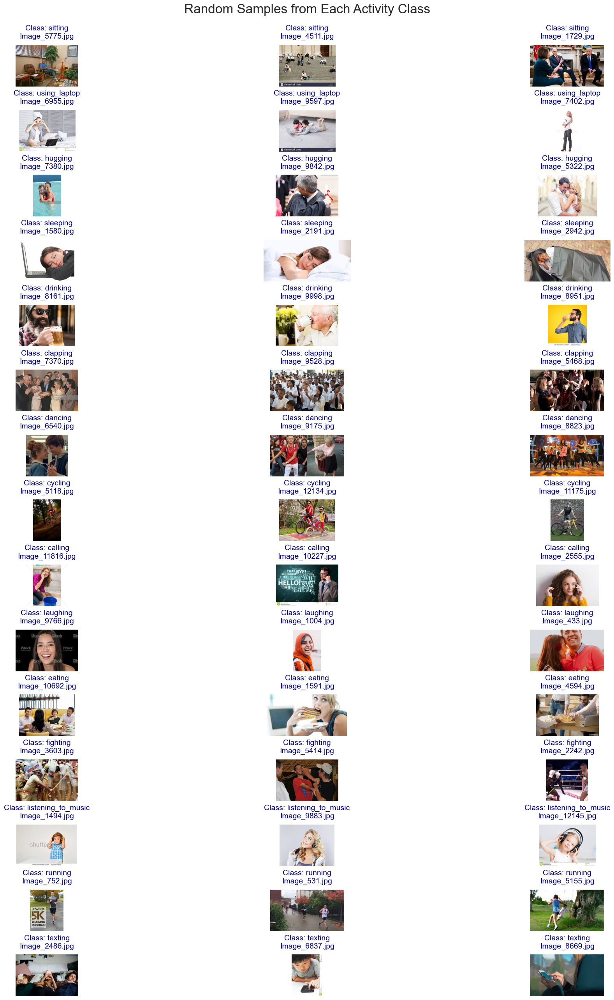

In [133]:
def display_samples_per_class(samples_per_class=3, figsize=(20, 25)):
 
    # Get unique activity classes
    unique_classes = train_df['label'].unique()
    num_classes = len(unique_classes)
    
    # Create figure with constrained layout instead of tight_layout
    fig, axes = plt.subplots(num_classes, samples_per_class, 
                           figsize=figsize,
                           constrained_layout=True)  # Use constrained_layout
    
    fig.suptitle('Random Samples from Each Activity Class', fontsize=24, y=1.02)
    
    # If only one class, convert axes to 2D array for consistent indexing
    if num_classes == 1:
        axes = axes.reshape(1, -1)
    
    for row, activity in enumerate(unique_classes):
        # Get all images for current activity class
        class_images = train_df[train_df['label'] == activity]['filename'].tolist()
        
        # Randomly select samples
        selected_samples = random.sample(class_images, min(samples_per_class, len(class_images)))
        
        for col, img_filename in enumerate(selected_samples):
            img_path = os.path.join("Data", "train", img_filename)
            ax = axes[row, col]
            
            if os.path.exists(img_path):
                # Read and display image
                image = mpimg.imread(img_path)
                ax.imshow(image)
                ax.set_title(f"Class: {activity}\n{img_filename}", 
                           fontsize=14, pad=12, color='navy')
                ax.axis('off')
                
                # Add border
                for spine in ax.spines.values():
                    spine.set_edgecolor('lightgray')
                    spine.set_linewidth(2)
            else:
                ax.axis('off')
                ax.text(0.5, 0.5, 'Image not found', 
                       ha='center', va='center', color='red', fontsize=12)
    
    # Remove empty subplots if any class has fewer than samples_per_class images
    for row in range(num_classes):
        for col in range(samples_per_class):
            if col >= len(train_df[train_df['label'] == unique_classes[row]]):
                fig.delaxes(axes[row, col])
    
    plt.show()

# Display 3 samples from each class
display_samples_per_class(samples_per_class=3, figsize=(20, 25))

In [19]:
image_filenames = train_df['filename']  # List of image filenames
activity_labels = train_df['label']     # List of activity labels

In [24]:
# Initialize containers for image data and labels
image_data = []
image_labels = []

# Predefined image size
TARGET_IMAGE_SIZE = (224, 224)
TRAIN_DATA_PATH = 'Data/train/'

# Process each image in the training folder
for i in range(len(train_image_files)):
    try:
        # Construct full image path
        image_path = os.path.join(TRAIN_DATA_PATH, image_filenames[i])
        
        # Open and resize image
        with Image.open(image_path) as img:
            resized_img = img.resize(TARGET_IMAGE_SIZE)
            image_data.append(np.asarray(resized_img))
            image_labels.append(activity_labels[i])
            
    except Exception as e:
        print(f"Error processing image {image_filenames[i]}: {str(e)}")
        continue

# Convert to numpy arrays for machine learning
image_data = np.array(image_data)
image_labels = np.array(image_labels)

In [25]:
# Convert image data list to numpy array
X = np.array(image_data)  # More descriptive variable name

# Verify the conversion
print(f"Data type: {type(X)}")
print(f"Number of images: {len(X)}")
print(f"Array shape: {X.shape}")  # Added shape information
print(f"Data type: {X.dtype}")   # Added dtype information

Data type: <class 'numpy.ndarray'>
Number of images: 12600
Array shape: (12600, 224, 224, 3)
Data type: uint8


In [28]:
# Convert labels to categorical one-hot encoding
activity_labels = train_df["label"]
label_codes, unique_labels = pd.factorize(activity_labels)
y = to_categorical(label_codes)

# Print information about the conversion
print("Label Encoding Details:")
print(f"Unique activity classes: {unique_labels}")
print(f"Number of classes: {len(unique_labels)}")
print(f"First encoded sample: {y[0]}")
print(f"Shape of y_train: {y.shape}")

# Create a mapping dictionary for reference
label_mapping = {i: label for i, label in enumerate(unique_labels)}
print("\nClass Index to Label Mapping:")
for index, label in label_mapping.items():
    print(f"Class {index}: {label}")

Label Encoding Details:
Unique activity classes: Index(['sitting', 'using_laptop', 'hugging', 'sleeping', 'drinking',
       'clapping', 'dancing', 'cycling', 'calling', 'laughing', 'eating',
       'fighting', 'listening_to_music', 'running', 'texting'],
      dtype='object')
Number of classes: 15
First encoded sample: [1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
Shape of y_train: (12600, 15)

Class Index to Label Mapping:
Class 0: sitting
Class 1: using_laptop
Class 2: hugging
Class 3: sleeping
Class 4: drinking
Class 5: clapping
Class 6: dancing
Class 7: cycling
Class 8: calling
Class 9: laughing
Class 10: eating
Class 11: fighting
Class 12: listening_to_music
Class 13: running
Class 14: texting


In [30]:
# Modern style settings
sns.set_theme(style="whitegrid", palette="pastel")
plt.style.use('ggplot')  # Using one of the available styles

# Create dataframe
data = {
    'Model': ['B0', 'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7'],
    'Scaling (ϕ)': [0, 1, 2, 3, 4, 5, 6, 7],
    'Top-1 Acc (%)': [77.1, 79.1, 80.1, 81.6, 82.9, 83.6, 84.0, 84.3],
    'Params (M)': [5.3, 7.8, 9.2, 12, 19, 30, 43, 66],
    'FLOPs (B)': [0.39, 0.70, 1.0, 1.8, 4.2, 9.9, 19, 37],
    'Depth': [230, 240, 260, 300, 380, 490, 560, 660],
    'Resolution': ['224×224', '240×240', '260×260', '300×300', '380×380', '456×456', '528×528', '600×600'],
    'Speed': ['⚡ Fastest', '🚀 Fast', '🏃 Medium', '🏃 Medium', '🐢 Slow', '🐢 Slow', '🚶 Very Slow', '🐌 Slowest']
}

df = pd.DataFrame(data).set_index('Model')

# Advanced styling function
def style_table(df):
    styler = df.style\
        .background_gradient(cmap='YlGnBu', subset=['Top-1 Acc (%)'])\
        .background_gradient(cmap='RdPu', subset=['Params (M)'])\
        .background_gradient(cmap='OrRd', subset=['FLOPs (B)'])\
        .background_gradient(cmap='Purples', subset=['Depth'])\
        .set_properties(**{
            'text-align': 'center',
            'font-size': '12pt',
            'font-family': 'Arial',
            'border': '1px solid #dddddd'
        })\
        .set_table_styles([{
            'selector': 'th',
            'props': [('background-color', '#4472C4'), 
                     ('color', 'white'),
                     ('font-weight', 'bold')]
        }])\
        .set_caption('<h2 style="text-align:center;font-size:16pt">EfficientNet Models Comparison (v1)</h2>')\
        .format({
            'Top-1 Acc (%)': '{:.1f}%',
            'Params (M)': '{:.1f}M',
            'FLOPs (B)': lambda x: f"{x:.1f}B" if x < 10 else f"{x:.0f}B"
        })
    
    # Add symbols to column headers
    column_symbols = {
        'Scaling (ϕ)': 'ϕ',
        'Top-1 Acc (%)': '📊',
        'Params (M)': '🧠',
        'FLOPs (B)': '⚡',
        'Depth': '📏',
        'Resolution': '🖼️',
        'Speed': '⏱️'
    }
    
    styler.columns = [f"{column_symbols.get(col, '')} {col}" for col in df.columns]
    
    return styler

# Display table
display(style_table(df))

# Save as HTML (optional)
df_styled = style_table(df)
df_styled.to_html('efficientnet_table.html', encoding='utf-8')

,Scaling (ϕ),Top-1 Acc (%),Params (M),FLOPs (B),Depth,Resolution,Speed
Model,,,,,,,
B0,0,77.1%,5.3M,0.4B,230,224×224,⚡ Fastest
B1,1,79.1%,7.8M,0.7B,240,240×240,🚀 Fast
B2,2,80.1%,9.2M,1.0B,260,260×260,🏃 Medium
B3,3,81.6%,12.0M,1.8B,300,300×300,🏃 Medium
B4,4,82.9%,19.0M,4.2B,380,380×380,🐢 Slow
B5,5,83.6%,30.0M,9.9B,490,456×456,🐢 Slow
B6,6,84.0%,43.0M,19B,560,528×528,🚶 Very Slow
B7,7,84.3%,66.0M,37B,660,600×600,🐌 Slowest


In [37]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, 
    random_state=42,  # for reproducibility
    stratify=y       # preserve class distribution
)

# Normalize pixel values to be between 0 and 1
#X_train = X_train.astype('float32') / 255.0
#X_test = X_test.astype('float32') / 255.0

# Print dataset information
print("Dataset Information:")
print(f"Training set shape: X_train={X_train.shape}, y_train={y_train.shape}")
print(f"Test set shape: X_test={X_test.shape}, y_test={y_test.shape}")
print(f"Pixel value range - Min: {X_train.min()}, Max: {X_train.max()}")

Dataset Information:
Training set shape: X_train=(10080, 224, 224, 3), y_train=(10080, 15)
Test set shape: X_test=(2520, 224, 224, 3), y_test=(2520, 15)
Pixel value range - Min: 0, Max: 255


In [98]:
base_model = EfficientNetB0(
    include_top=False,
    input_shape=(224, 224, 3),
    weights="imagenet"
)

for layer in base_model.layers:
    if not isinstance(layer, tf.keras.layers.BatchNormalization):
        layer.trainable = False

model = Sequential([
    base_model,
    GlobalAveragePooling2D(),
    BatchNormalization(),
    Dense(128, activation='relu', kernel_regularizer=regularizers.l2(1e-3)),
    Dropout(0.5),
    Dense(128, activation='relu'),
    Dropout(0.3),
    Dense(15, activation='softmax')
])

optimizer = Adam(learning_rate=1e-4)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

In [43]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ efficientnetb0 (Functional)          │ (None, 7, 7, 1280)          │       4,049,571 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ global_average_pooling2d             │ (None, 1280)                │               0 │
│ (GlobalAveragePooling2D)             │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 1280)                │           5,120 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 128)                 │         163,968 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 128)                 │          16,512 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 128)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 15)                  │           1,935 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 4,237,106 (16.16 MB)

 Trainable params: 226,991 (886.68 KB)

 Non-trainable params: 4,010,115 (15.30 MB)

In [99]:
#  Train the model 60+20
history = model.fit(
    X_train, y_train,
    epochs=60,
    batch_size=32,
    validation_data=(X_test, y_test),
)

In [ ]:
Epoch 1/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 107s 142ms/step - accuracy: 0.0968 - loss: 3.4174 - val_accuracy: 0.3500 - val_loss: 2.4342
Epoch 2/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 34s 93ms/step - accuracy: 0.2188 - loss: 2.7133 - val_accuracy: 0.4619 - val_loss: 2.0380
Epoch 3/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.3094 - loss: 2.3991 - val_accuracy: 0.5270 - val_loss: 1.8129
Epoch 4/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.3754 - loss: 2.1700 - val_accuracy: 0.5671 - val_loss: 1.6600
Epoch 5/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.4237 - loss: 2.0404 - val_accuracy: 0.5948 - val_loss: 1.5628
Epoch 6/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.4540 - loss: 1.9395 - val_accuracy: 0.6147 - val_loss: 1.4880
Epoch 7/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.4790 - loss: 1.8482 - val_accuracy: 0.6242 - val_loss: 1.4262
Epoch 8/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.4968 - loss: 1.7902 - val_accuracy: 0.6357 - val_loss: 1.3776
Epoch 9/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - accuracy: 0.5258 - loss: 1.7077 - val_accuracy: 0.6464 - val_loss: 1.3356
Epoch 10/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - accuracy: 0.5381 - loss: 1.6491 - val_accuracy: 0.6560 - val_loss: 1.3006
Epoch 11/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.5690 - loss: 1.5753 - val_accuracy: 0.6663 - val_loss: 1.2682
Epoch 12/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.5804 - loss: 1.5268 - val_accuracy: 0.6754 - val_loss: 1.2449
Epoch 13/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.5886 - loss: 1.5101 - val_accuracy: 0.6798 - val_loss: 1.2217
Epoch 14/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.6085 - loss: 1.4416 - val_accuracy: 0.6837 - val_loss: 1.2032
Epoch 15/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.6081 - loss: 1.4263 - val_accuracy: 0.6901 - val_loss: 1.1838
Epoch 16/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.6170 - loss: 1.4190 - val_accuracy: 0.6929 - val_loss: 1.1664
Epoch 17/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.6418 - loss: 1.3417 - val_accuracy: 0.6980 - val_loss: 1.1505
Epoch 18/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - accuracy: 0.6430 - loss: 1.3226 - val_accuracy: 0.7024 - val_loss: 1.1393
Epoch 19/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.6500 - loss: 1.2799 - val_accuracy: 0.7099 - val_loss: 1.1233
Epoch 20/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - accuracy: 0.6541 - loss: 1.2668 - val_accuracy: 0.7155 - val_loss: 1.1130
Epoch 21/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.6632 - loss: 1.2660 - val_accuracy: 0.7183 - val_loss: 1.1036
Epoch 22/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.6683 - loss: 1.2467 - val_accuracy: 0.7190 - val_loss: 1.0920
Epoch 23/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.6669 - loss: 1.2340 - val_accuracy: 0.7218 - val_loss: 1.0848
Epoch 24/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 94ms/step - accuracy: 0.6760 - loss: 1.2075 - val_accuracy: 0.7206 - val_loss: 1.0800
Epoch 25/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 44s 103ms/step - accuracy: 0.6804 - loss: 1.1835 - val_accuracy: 0.7175 - val_loss: 1.0711
Epoch 26/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - accuracy: 0.6967 - loss: 1.1253 - val_accuracy: 0.7214 - val_loss: 1.0620
Epoch 27/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.7089 - loss: 1.1012 - val_accuracy: 0.7250 - val_loss: 1.0529
Epoch 28/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - accuracy: 0.7088 - loss: 1.0993 - val_accuracy: 0.7258 - val_loss: 1.0461
Epoch 29/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.7134 - loss: 1.0883 - val_accuracy: 0.7282 - val_loss: 1.0423
Epoch 30/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.7137 - loss: 1.0623 - val_accuracy: 0.7266 - val_loss: 1.0376
Epoch 31/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.7161 - loss: 1.0704 - val_accuracy: 0.7345 - val_loss: 1.0314
Epoch 32/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.7222 - loss: 1.0261 - val_accuracy: 0.7373 - val_loss: 1.0241
Epoch 33/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - accuracy: 0.7187 - loss: 1.0410 - val_accuracy: 0.7381 - val_loss: 1.0201
Epoch 34/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.7285 - loss: 1.0002 - val_accuracy: 0.7361 - val_loss: 1.0148
Epoch 35/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 32s 102ms/step - accuracy: 0.7322 - loss: 1.0074 - val_accuracy: 0.7357 - val_loss: 1.0108
Epoch 36/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - accuracy: 0.7476 - loss: 0.9660 - val_accuracy: 0.7385 - val_loss: 1.0080
Epoch 37/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.7554 - loss: 0.9553 - val_accuracy: 0.7393 - val_loss: 1.0056
Epoch 38/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - accuracy: 0.7491 - loss: 0.9494 - val_accuracy: 0.7369 - val_loss: 0.9995
Epoch 39/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.7541 - loss: 0.9403 - val_accuracy: 0.7401 - val_loss: 0.9956
Epoch 40/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.7608 - loss: 0.9135 - val_accuracy: 0.7393 - val_loss: 0.9911
Epoch 41/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.7549 - loss: 0.9252 - val_accuracy: 0.7405 - val_loss: 0.9877
Epoch 42/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.7661 - loss: 0.8928 - val_accuracy: 0.7393 - val_loss: 0.9878
Epoch 43/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - accuracy: 0.7679 - loss: 0.8770 - val_accuracy: 0.7413 - val_loss: 0.9833
Epoch 44/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.7729 - loss: 0.8725 - val_accuracy: 0.7417 - val_loss: 0.9830
Epoch 45/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 43s 102ms/step - accuracy: 0.7699 - loss: 0.8617 - val_accuracy: 0.7448 - val_loss: 0.9797
Epoch 46/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 38s 94ms/step - accuracy: 0.7720 - loss: 0.8704 - val_accuracy: 0.7464 - val_loss: 0.9782
Epoch 47/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.7850 - loss: 0.8176 - val_accuracy: 0.7488 - val_loss: 0.9774
Epoch 48/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - accuracy: 0.7768 - loss: 0.8456 - val_accuracy: 0.7444 - val_loss: 0.9744
Epoch 49/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.7872 - loss: 0.8189 - val_accuracy: 0.7496 - val_loss: 0.9730
Epoch 50/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - accuracy: 0.7871 - loss: 0.8137 - val_accuracy: 0.7520 - val_loss: 0.9720
Epoch 51/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 40s 93ms/step - accuracy: 0.7956 - loss: 0.7814 - val_accuracy: 0.7504 - val_loss: 0.9726
Epoch 52/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.7843 - loss: 0.8050 - val_accuracy: 0.7512 - val_loss: 0.9714
Epoch 53/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.7969 - loss: 0.7749 - val_accuracy: 0.7512 - val_loss: 0.9697
Epoch 54/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.7993 - loss: 0.7759 - val_accuracy: 0.7472 - val_loss: 0.9711
Epoch 55/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.8033 - loss: 0.7467 - val_accuracy: 0.7524 - val_loss: 0.9700
Epoch 56/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.8019 - loss: 0.7449 - val_accuracy: 0.7524 - val_loss: 0.9686
Epoch 57/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.8073 - loss: 0.7507 - val_accuracy: 0.7512 - val_loss: 0.9717
Epoch 58/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.8185 - loss: 0.7264 - val_accuracy: 0.7520 - val_loss: 0.9700
Epoch 59/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.8109 - loss: 0.7081 - val_accuracy: 0.7544 - val_loss: 0.9765
Epoch 60/60
315/315 ━━━━━━━━━━━━━━━━━━━━ 43s 101ms/step - accuracy: 0.8133 - loss: 0.7454 - val_accuracy: 0.7552 - val_loss: 0.9706

In [134]:
# "Add 20 more epochs for training."

In [ ]:
Epoch 1/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 34s 106ms/step - accuracy: 0.8242 - loss: 0.7119 - val_accuracy: 0.7528 - val_loss: 0.9724
Epoch 2/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 37s 94ms/step - accuracy: 0.8242 - loss: 0.6996 - val_accuracy: 0.7540 - val_loss: 0.9779
Epoch 3/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.8180 - loss: 0.7036 - val_accuracy: 0.7552 - val_loss: 0.9694
Epoch 4/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 42s 96ms/step - accuracy: 0.8218 - loss: 0.6855 - val_accuracy: 0.7571 - val_loss: 0.9694
Epoch 5/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 40s 94ms/step - accuracy: 0.8272 - loss: 0.6766 - val_accuracy: 0.7528 - val_loss: 0.9693
Epoch 6/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.8318 - loss: 0.6601 - val_accuracy: 0.7520 - val_loss: 0.9766
Epoch 7/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - accuracy: 0.8311 - loss: 0.6558 - val_accuracy: 0.7560 - val_loss: 0.9800
Epoch 8/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 95ms/step - accuracy: 0.8251 - loss: 0.6796 - val_accuracy: 0.7512 - val_loss: 0.9790
Epoch 9/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 30s 95ms/step - accuracy: 0.8336 - loss: 0.6515 - val_accuracy: 0.7544 - val_loss: 0.9772
Epoch 10/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 40s 93ms/step - accuracy: 0.8382 - loss: 0.6330 - val_accuracy: 0.7575 - val_loss: 0.9815
Epoch 11/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 44s 102ms/step - accuracy: 0.8433 - loss: 0.6223 - val_accuracy: 0.7548 - val_loss: 0.9816
Epoch 12/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 38s 93ms/step - accuracy: 0.8344 - loss: 0.6487 - val_accuracy: 0.7556 - val_loss: 0.9782
Epoch 13/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.8386 - loss: 0.6291 - val_accuracy: 0.7548 - val_loss: 0.9851
Epoch 14/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 30s 94ms/step - accuracy: 0.8339 - loss: 0.6341 - val_accuracy: 0.7548 - val_loss: 0.9818
Epoch 15/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.8403 - loss: 0.6251 - val_accuracy: 0.7556 - val_loss: 0.9848
Epoch 16/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 94ms/step - accuracy: 0.8458 - loss: 0.6135 - val_accuracy: 0.7567 - val_loss: 0.9870
Epoch 17/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.8445 - loss: 0.6127 - val_accuracy: 0.7536 - val_loss: 0.9900
Epoch 18/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 41s 93ms/step - accuracy: 0.8425 - loss: 0.6094 - val_accuracy: 0.7595 - val_loss: 0.9822
Epoch 19/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 42s 95ms/step - accuracy: 0.8454 - loss: 0.5879 - val_accuracy: 0.7583 - val_loss: 0.9787
Epoch 20/20
315/315 ━━━━━━━━━━━━━━━━━━━━ 29s 93ms/step - accuracy: 0.8614 - loss: 0.5700 - val_accuracy: 0.7560 - val_loss: 0.9820

In [45]:
# Save the trained model to a file
model.save('model_3.keras')  

In [50]:
model_3 = load_model('Models/model_3.keras')

In [57]:
def read_img(fn,size=(224,224)):
    img = Image.open(fn)
    return np.asarray(img.resize(size))

In [58]:
def test_predict(test_image,model):
    # List of class labels matching the order of class indices
    class_labels = [
        'sitting',
        'using_laptop',
        'hugging',
        'sleeping',
        'drinking',
        'clapping',
        'dancing',
        'cycling',
        'calling',
        'laughing',
        'eating',
        'fighting',
        'listening_to_music',
        'running',
        'texting'
    ]
    
    # Model prediction
    result = model.predict(np.asarray([read_img(test_image)]))
    probabilities = result[0]  # Get the probability vector
    
    # Create a pandas DataFrame for the probabilities
    prob_df = pd.DataFrame({
        'Class Index': range(len(class_labels)),
        'Label': class_labels,
        'Probability (%)': (probabilities * 100).round(2)
    }).sort_values('Probability (%)', ascending=False)
    
    # Add a rank column
    prob_df['Rank'] = range(1, len(prob_df)+1)
    
    # Get predicted class
    predicted_class = np.argmax(probabilities)
    probability = np.max(probabilities) * 100
    predicted_label = class_labels[predicted_class]
    
    # Print the probability table
    #print("\nProbability Distribution:")
    #print(prob_df.to_string(index=False))
    
    # Print top prediction
    print(f"\nTop Prediction: {predicted_label} (class {predicted_class}) with {probability:.2f}% confidence")
    
    # Display image with prediction
    image = img.imread(test_image)
    plt.imshow(image)
    plt.title(f"Prediction: {predicted_label}\nConfidence: {probability:.2f}%", fontsize=10)
    plt.axis('off')
    
    # Display the table below the image
    plt.show()
    display(prob_df.style
            .background_gradient(cmap='Blues', subset=['Probability (%)'])
            .set_caption('Class Probabilities'))

In [53]:
input_shape = model_3.input_shape  
print("Input Shape:", input_shape)  

Input Shape: (None, 224, 224, 3)


In [54]:
X_test.shape

(2520, 224, 224, 3)

In [60]:
class_names = ['sitting', 'using_laptop', 'hugging', 'sleeping', 'drinking',
       'clapping', 'dancing', 'cycling', 'calling', 'laughing', 'eating',
       'fighting', 'listening_to_music', 'running', 'texting']

In [55]:
import numpy as np

# Model prediction (output is class probabilities)
y_pred_probs = model_3.predict(X_test)

# Convert probabilities to class labels (0 to 14 for 15 classes)
y_pred = np.argmax(y_pred_probs, axis=1)

# If y_test is one-hot encoded, convert it to labels as well
y_true = np.argmax(y_test, axis=1)

79/79 ━━━━━━━━━━━━━━━━━━━━ 138s 2s/step


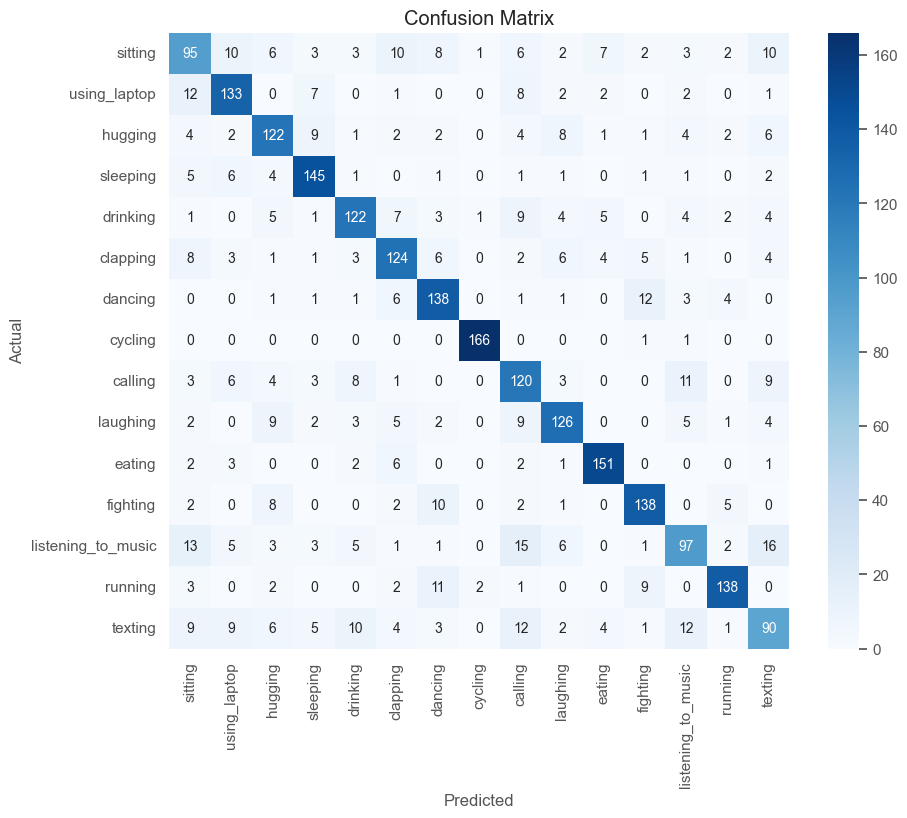

In [61]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Calculate confusion matrix
cm = confusion_matrix(y_true, y_pred)

# Display matrix as heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=class_names,
            yticklabels=class_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')  # Alternatively: 'True' (both are correct)
plt.title('Confusion Matrix')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step

Top Prediction: texting (class 14) with 59.55% confidence


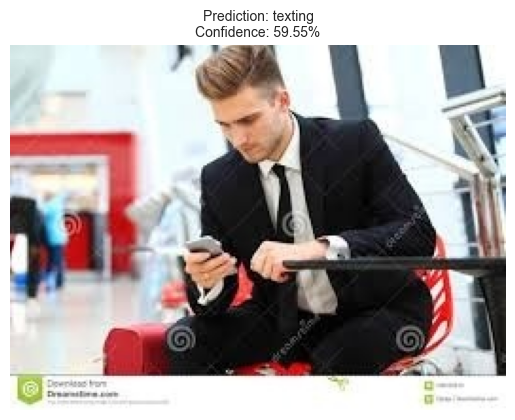

,Class Index,Label,Probability (%),Rank
14,14,texting,59.549999,1
0,0,sitting,14.340000,2
8,8,calling,14.330000,3
12,12,listening_to_music,5.220000,4
1,1,using_laptop,3.980000,5
4,4,drinking,1.240000,6
10,10,eating,0.370000,7
5,5,clapping,0.260000,8
13,13,running,0.200000,9
7,7,cycling,0.130000,10


In [221]:
test_predict("Data/test/Image_5371.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step

Top Prediction: clapping (class 5) with 99.80% confidence


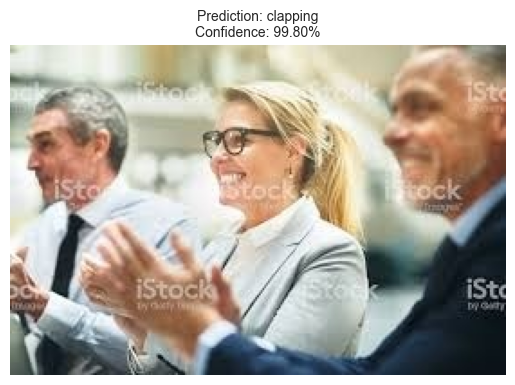

,Class Index,Label,Probability (%),Rank
5,5,clapping,99.800003,1
0,0,sitting,0.130000,2
2,2,hugging,0.010000,3
6,6,dancing,0.010000,4
8,8,calling,0.010000,5
9,9,laughing,0.010000,6
10,10,eating,0.010000,7
11,11,fighting,0.010000,8
14,14,texting,0.010000,9
1,1,using_laptop,0.000000,10


In [184]:
test_predict("Data/test/Image_1070.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step

Top Prediction: running (class 13) with 98.26% confidence


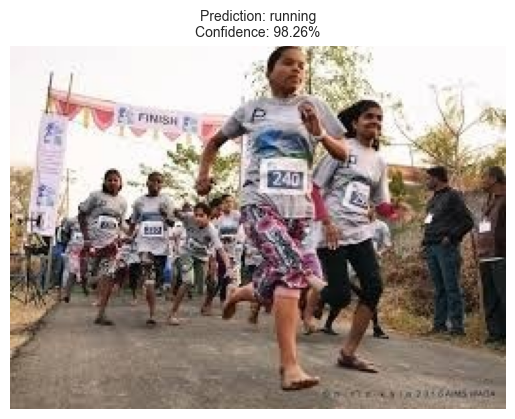

,Class Index,Label,Probability (%),Rank
13,13,running,98.260002,1
6,6,dancing,1.640000,2
11,11,fighting,0.070000,3
7,7,cycling,0.030000,4
0,0,sitting,0.000000,5
1,1,using_laptop,0.000000,6
2,2,hugging,0.000000,7
3,3,sleeping,0.000000,8
4,4,drinking,0.000000,9
5,5,clapping,0.000000,10


In [178]:
test_predict("Data/test/Image_873.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step

Top Prediction: texting (class 14) with 91.65% confidence


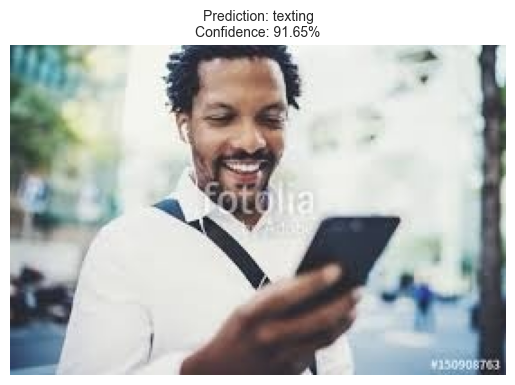

,Class Index,Label,Probability (%),Rank
14,14,texting,91.650002,1
12,12,listening_to_music,2.990000,2
1,1,using_laptop,1.520000,3
5,5,clapping,1.470000,4
9,9,laughing,0.960000,5
8,8,calling,0.530000,6
0,0,sitting,0.400000,7
10,10,eating,0.210000,8
4,4,drinking,0.180000,9
13,13,running,0.070000,10


In [81]:
test_predict("Data/test/Image_1005.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step

Top Prediction: using_laptop (class 1) with 98.01% confidence


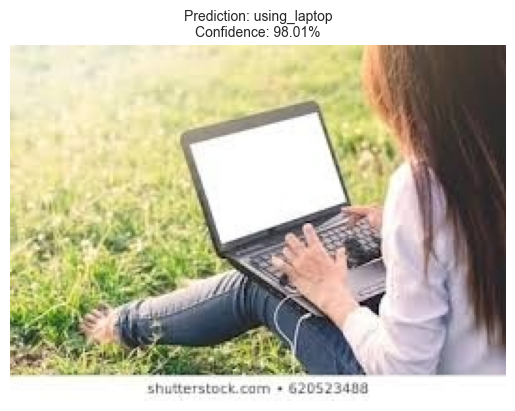

,Class Index,Label,Probability (%),Rank
1,1,using_laptop,98.010002,1
14,14,texting,0.780000,2
0,0,sitting,0.620000,3
12,12,listening_to_music,0.240000,4
8,8,calling,0.110000,5
5,5,clapping,0.070000,6
3,3,sleeping,0.060000,7
4,4,drinking,0.050000,8
2,2,hugging,0.020000,9
10,10,eating,0.020000,10


In [115]:
test_predict("Data/test/Image_4521.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step

Top Prediction: drinking (class 4) with 99.96% confidence


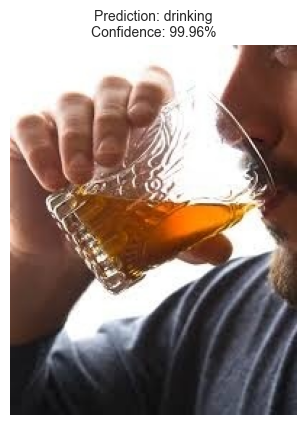

,Class Index,Label,Probability (%),Rank
4,4,drinking,99.959999,1
5,5,clapping,0.020000,2
12,12,listening_to_music,0.020000,3
0,0,sitting,0.000000,4
1,1,using_laptop,0.000000,5
2,2,hugging,0.000000,6
3,3,sleeping,0.000000,7
6,6,dancing,0.000000,8
7,7,cycling,0.000000,9
8,8,calling,0.000000,10


In [85]:
test_predict("Data/test/Image_3001.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step

Top Prediction: sitting (class 0) with 97.79% confidence


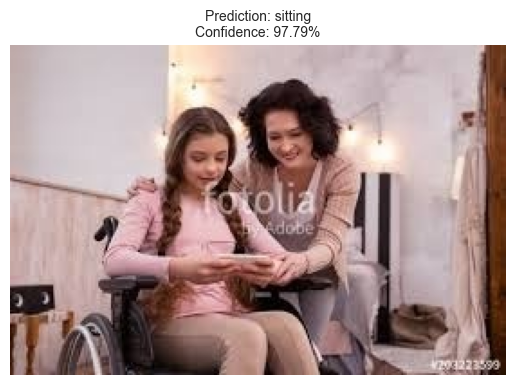

,Class Index,Label,Probability (%),Rank
0,0,sitting,97.790001,1
14,14,texting,0.910000,2
2,2,hugging,0.640000,3
1,1,using_laptop,0.320000,4
3,3,sleeping,0.110000,5
5,5,clapping,0.100000,6
12,12,listening_to_music,0.090000,7
9,9,laughing,0.020000,8
4,4,drinking,0.010000,9
8,8,calling,0.010000,10


In [109]:
test_predict("Data/test/Image_4005.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step

Top Prediction: cycling (class 7) with 100.00% confidence


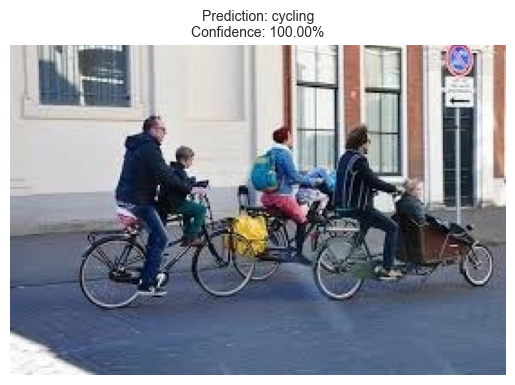

,Class Index,Label,Probability (%),Rank
7,7,cycling,100.000000,1
0,0,sitting,0.000000,2
1,1,using_laptop,0.000000,3
2,2,hugging,0.000000,4
3,3,sleeping,0.000000,5
4,4,drinking,0.000000,6
5,5,clapping,0.000000,7
6,6,dancing,0.000000,8
8,8,calling,0.000000,9
9,9,laughing,0.000000,10


In [86]:
test_predict("Data/test/Image_2025.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step

Top Prediction: listening_to_music (class 12) with 95.43% confidence


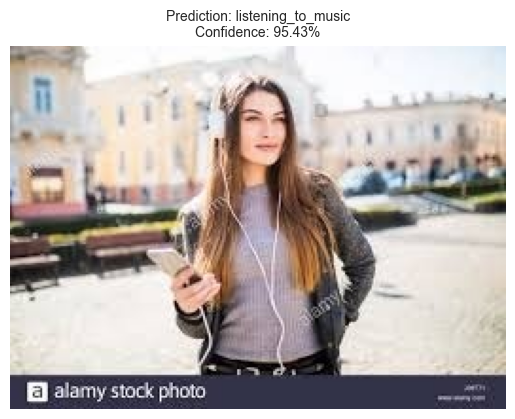

,Class Index,Label,Probability (%),Rank
12,12,listening_to_music,95.430000,1
14,14,texting,4.450000,2
8,8,calling,0.060000,3
9,9,laughing,0.030000,4
4,4,drinking,0.020000,5
0,0,sitting,0.010000,6
1,1,using_laptop,0.000000,7
2,2,hugging,0.000000,8
3,3,sleeping,0.000000,9
5,5,clapping,0.000000,10


In [102]:
test_predict("Data/test/Image_547.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step

Top Prediction: clapping (class 5) with 100.00% confidence


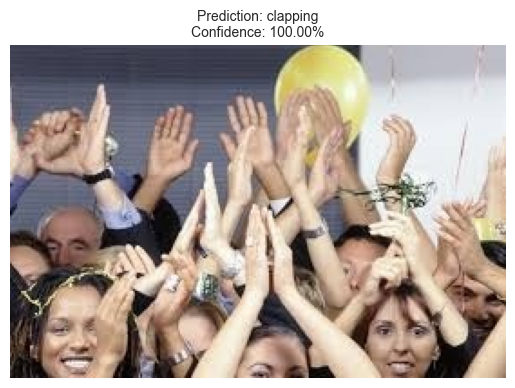

,Class Index,Label,Probability (%),Rank
5,5,clapping,100.000000,1
0,0,sitting,0.000000,2
1,1,using_laptop,0.000000,3
2,2,hugging,0.000000,4
3,3,sleeping,0.000000,5
4,4,drinking,0.000000,6
6,6,dancing,0.000000,7
7,7,cycling,0.000000,8
8,8,calling,0.000000,9
9,9,laughing,0.000000,10


In [90]:
test_predict("Data/test/Image_133.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step

Top Prediction: fighting (class 11) with 86.48% confidence


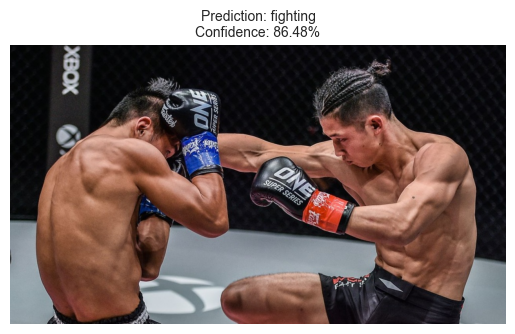

,Class Index,Label,Probability (%),Rank
11,11,fighting,86.480003,1
6,6,dancing,5.160000,2
4,4,drinking,2.570000,3
13,13,running,1.790000,4
12,12,listening_to_music,0.830000,5
3,3,sleeping,0.680000,6
2,2,hugging,0.630000,7
7,7,cycling,0.330000,8
14,14,texting,0.310000,9
9,9,laughing,0.290000,10


In [65]:
test_predict("D_image/t3.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Top Prediction: running (class 13) with 99.80% confidence


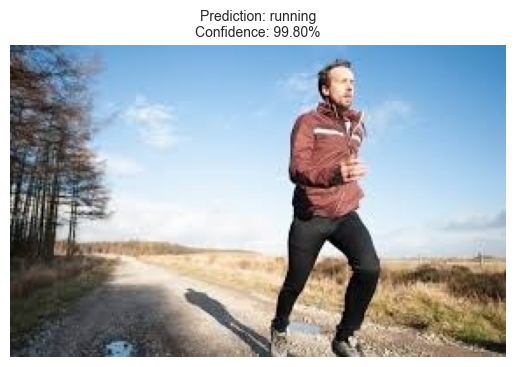

,Class Index,Label,Probability (%),Rank
13,13,running,99.800003,1
6,6,dancing,0.070000,2
12,12,listening_to_music,0.060000,3
11,11,fighting,0.030000,4
2,2,hugging,0.010000,5
5,5,clapping,0.010000,6
7,7,cycling,0.010000,7
0,0,sitting,0.000000,8
1,1,using_laptop,0.000000,9
3,3,sleeping,0.000000,10


In [76]:
test_predict("Data/test/Image_100.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

Top Prediction: eating (class 10) with 100.00% confidence


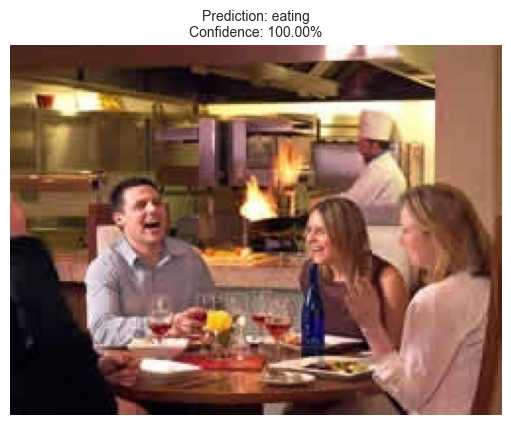

,Class Index,Label,Probability (%),Rank
10,10,eating,100.000000,1
0,0,sitting,0.000000,2
1,1,using_laptop,0.000000,3
2,2,hugging,0.000000,4
3,3,sleeping,0.000000,5
4,4,drinking,0.000000,6
5,5,clapping,0.000000,7
6,6,dancing,0.000000,8
7,7,cycling,0.000000,9
8,8,calling,0.000000,10


In [77]:
test_predict("Data/test/Image_2000.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step

Top Prediction: hugging (class 2) with 97.85% confidence


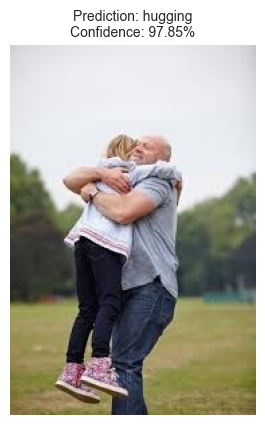

,Class Index,Label,Probability (%),Rank
2,2,hugging,97.849998,1
3,3,sleeping,0.990000,2
0,0,sitting,0.480000,3
14,14,texting,0.280000,4
13,13,running,0.140000,5
12,12,listening_to_music,0.060000,6
11,11,fighting,0.050000,7
8,8,calling,0.040000,8
9,9,laughing,0.040000,9
1,1,using_laptop,0.030000,10


In [79]:
test_predict("Data/test/Image_722.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step

Top Prediction: laughing (class 9) with 100.00% confidence


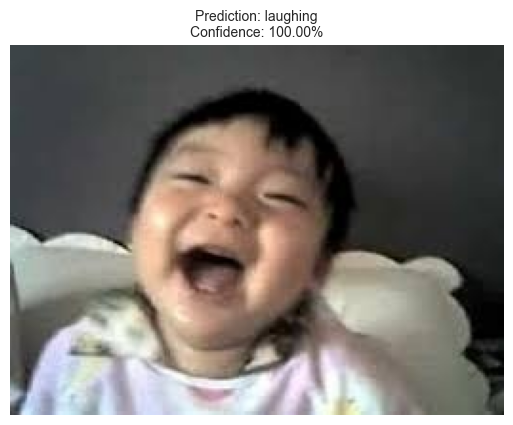

,Class Index,Label,Probability (%),Rank
9,9,laughing,100.000000,1
0,0,sitting,0.000000,2
1,1,using_laptop,0.000000,3
2,2,hugging,0.000000,4
3,3,sleeping,0.000000,5
4,4,drinking,0.000000,6
5,5,clapping,0.000000,7
6,6,dancing,0.000000,8
7,7,cycling,0.000000,9
8,8,calling,0.000000,10


In [91]:
test_predict("Data/test/Image_195.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step

Top Prediction: clapping (class 5) with 99.85% confidence


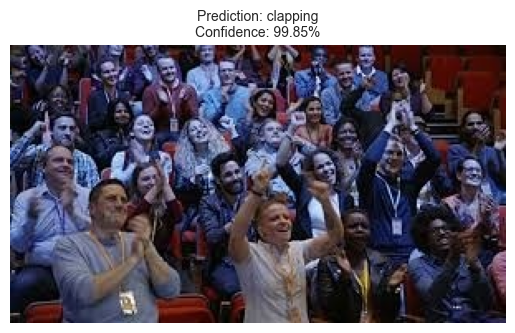

,Class Index,Label,Probability (%),Rank
5,5,clapping,99.849998,1
6,6,dancing,0.110000,2
11,11,fighting,0.020000,3
10,10,eating,0.010000,4
13,13,running,0.010000,5
0,0,sitting,0.000000,6
1,1,using_laptop,0.000000,7
2,2,hugging,0.000000,8
3,3,sleeping,0.000000,9
4,4,drinking,0.000000,10


In [94]:
test_predict("Data/test/Image_475.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step

Top Prediction: listening_to_music (class 12) with 97.08% confidence


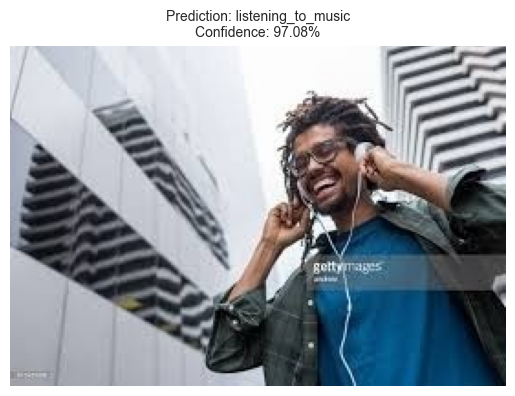

,Class Index,Label,Probability (%),Rank
12,12,listening_to_music,97.080002,1
8,8,calling,1.430000,2
14,14,texting,0.880000,3
2,2,hugging,0.530000,4
9,9,laughing,0.030000,5
1,1,using_laptop,0.010000,6
3,3,sleeping,0.010000,7
4,4,drinking,0.010000,8
6,6,dancing,0.010000,9
0,0,sitting,0.000000,10


In [97]:
test_predict("Data/test/Image_747.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step

Top Prediction: laughing (class 9) with 100.00% confidence


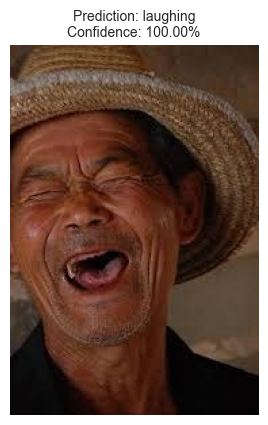

,Class Index,Label,Probability (%),Rank
9,9,laughing,100.000000,1
0,0,sitting,0.000000,2
1,1,using_laptop,0.000000,3
2,2,hugging,0.000000,4
3,3,sleeping,0.000000,5
4,4,drinking,0.000000,6
5,5,clapping,0.000000,7
6,6,dancing,0.000000,8
7,7,cycling,0.000000,9
8,8,calling,0.000000,10


In [119]:
test_predict("Data/test/Image_1997.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step

Top Prediction: calling (class 8) with 99.78% confidence


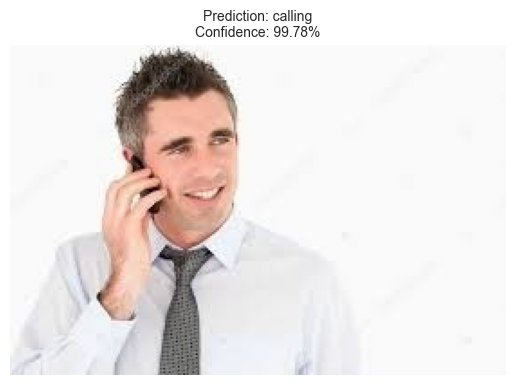

,Class Index,Label,Probability (%),Rank
8,8,calling,99.779999,1
9,9,laughing,0.110000,2
14,14,texting,0.050000,3
12,12,listening_to_music,0.030000,4
4,4,drinking,0.010000,5
5,5,clapping,0.010000,6
0,0,sitting,0.000000,7
1,1,using_laptop,0.000000,8
2,2,hugging,0.000000,9
3,3,sleeping,0.000000,10


In [122]:
test_predict("Data/test/Image_3741.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step

Top Prediction: eating (class 10) with 83.16% confidence


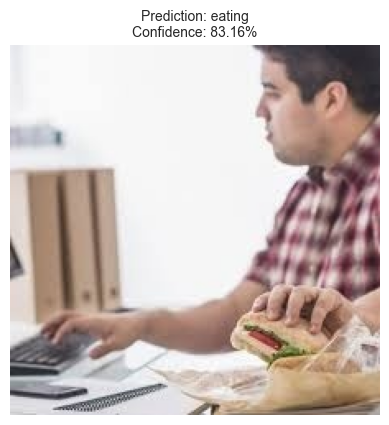

,Class Index,Label,Probability (%),Rank
10,10,eating,83.160004,1
1,1,using_laptop,14.210000,2
14,14,texting,1.210000,3
0,0,sitting,0.600000,4
4,4,drinking,0.220000,5
8,8,calling,0.170000,6
5,5,clapping,0.120000,7
9,9,laughing,0.090000,8
12,12,listening_to_music,0.080000,9
3,3,sleeping,0.050000,10


In [137]:
test_predict("Data/test/Image_300.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step

Top Prediction: clapping (class 5) with 99.21% confidence


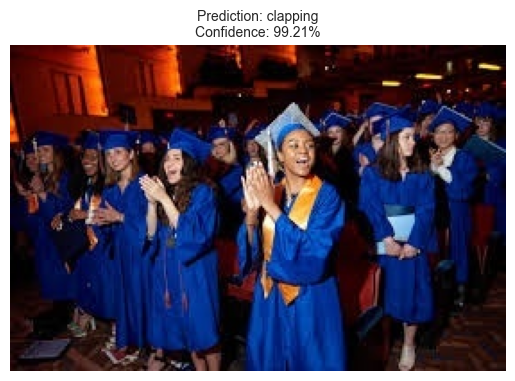

,Class Index,Label,Probability (%),Rank
5,5,clapping,99.209999,1
6,6,dancing,0.780000,2
0,0,sitting,0.000000,3
1,1,using_laptop,0.000000,4
2,2,hugging,0.000000,5
3,3,sleeping,0.000000,6
4,4,drinking,0.000000,7
7,7,cycling,0.000000,8
8,8,calling,0.000000,9
9,9,laughing,0.000000,10


In [142]:
test_predict("Data/test/Image_215.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step

Top Prediction: texting (class 14) with 99.77% confidence


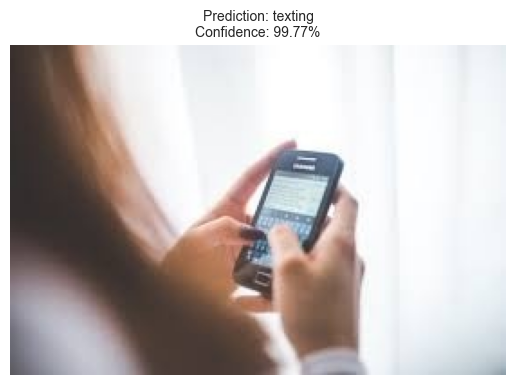

,Class Index,Label,Probability (%),Rank
14,14,texting,99.769997,1
8,8,calling,0.180000,2
12,12,listening_to_music,0.040000,3
0,0,sitting,0.000000,4
1,1,using_laptop,0.000000,5
2,2,hugging,0.000000,6
3,3,sleeping,0.000000,7
4,4,drinking,0.000000,8
5,5,clapping,0.000000,9
6,6,dancing,0.000000,10


In [168]:
test_predict("Data/test/Image_4422.jpg",model_3)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step

Top Prediction: calling (class 8) with 96.51% confidence


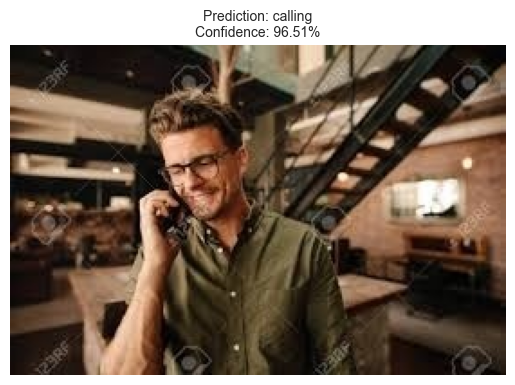

,Class Index,Label,Probability (%),Rank
8,8,calling,96.510002,1
14,14,texting,1.510000,2
4,4,drinking,0.790000,3
12,12,listening_to_music,0.620000,4
1,1,using_laptop,0.230000,5
9,9,laughing,0.180000,6
5,5,clapping,0.040000,7
6,6,dancing,0.040000,8
2,2,hugging,0.030000,9
10,10,eating,0.030000,10


In [173]:
test_predict("Data/test/Image_4716.jpg",model_3)

In [ ]:
# model_3